In [4]:
import sys
import tensorflow as tf
sys.path.append("/visuworks/Blindless_AIFFELTON/Models")

# import customized modules
import preprocess, data_generator, check_result, metrics, loss, train

sys.path.append("/visuworks/Blindless_AIFFELTON/Models/FR_Unet")
import fr_unet

# Insert Path
# {model_name}_{epoch}ep_{model_inpusize}_{Generator | aG/fG/sG}
FILE_NAME = 'fr_unet_28ep_256_aG'
INPUT_SHAPE = (256, 256, 1)
MODEL_PATH = "/visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/" + FILE_NAME + ".tf"
HISTORY_PATH = "/visuworks/Blindless_AIFFELTON/Models/FR_Unet/history/" + FILE_NAME + '_history' ".json"
SOURCE = '/visuworks/Dataset/Selected Dataset 2'

In [2]:
# Define custom objects for loading the model
custom_objects = {'DiceLoss': loss.DiceLoss(), 
                  'sensitivity': metrics.sensitivity,
                  'specificity': metrics.specificity,
                  'accuracy' : metrics.accuracy}


# Create augmentation
train_preproc = preprocess.build_augmentation_for_adaptive()
test_preproc = preprocess.build_augmentation_for_adaptive(is_train=False)

# Create train, test generator
train_generator = data_generator.AdaptiveDataGenerator(
    SOURCE, 
    number_of_images=2,
    img_size=INPUT_SHAPE,
    output_size=INPUT_SHAPE,
    is_train=True,
    augmentation= train_preproc
)

test_generator = data_generator.AdaptiveDataGenerator(
    SOURCE, 
    number_of_images=2,
    img_size=INPUT_SHAPE,
    output_size=INPUT_SHAPE,
    is_train=False,
    augmentation= test_preproc
)

# Create model
model = fr_unet.FR_UNet(num_classes=1, feature_scale=2, dropout=0.2, fuse=True, out_ave=True)

# # Input shape
input_shape = (256, 256, 1)

# # Build the model with the specified input shape
model.build(input_shape=(None, *input_shape))

# # Display the model summary
model.summary()

2024-01-28 15:11:24.007489: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 20763 MB memory:  -> device: 0, name: NVIDIA L4, pci bus id: 0000:00:03.0, compute capability: 8.9


Model: "fr_u_net"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block (Block)               multiple                  23648     
                                                                 
 block_1 (Block)             multiple                  42496     
                                                                 
 block_2 (Block)             multiple                  81408     
                                                                 
 block_3 (Block)             multiple                  81408     
                                                                 
 block_4 (Block)             multiple                  81408     
                                                                 
 block_5 (Block)             multiple                  37120     
                                                                 
 block_6 (Block)             multiple                  371

In [ ]:
train.model_train(model,
                  epoch = 50,
                  train_generator = train_generator,
                  test_generator = test_generator,
                  model_path = MODEL_PATH,
                  history_path = HISTORY_PATH)

2024-01-28 15:13:27.147368: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8904


250/250 [==============================] - 118s 437ms/step - loss: 0.2818 - sensitivity: 0.7903 - specificity: 0.9672 - accuracy: 0.9570
Loss: 0.28177541494369507
Sensitivity: 0.7902847528457642
Specificity: 0.9671554565429688
Accuracy: 0.9570363163948059


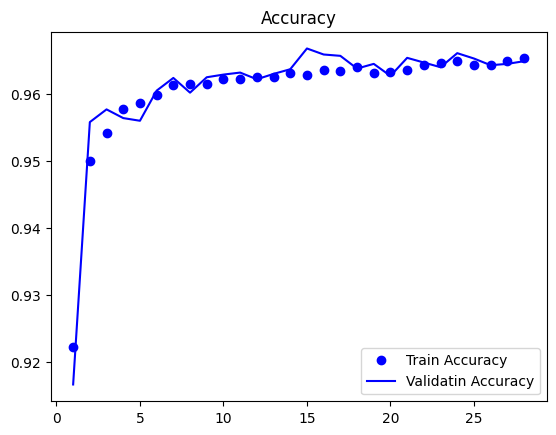

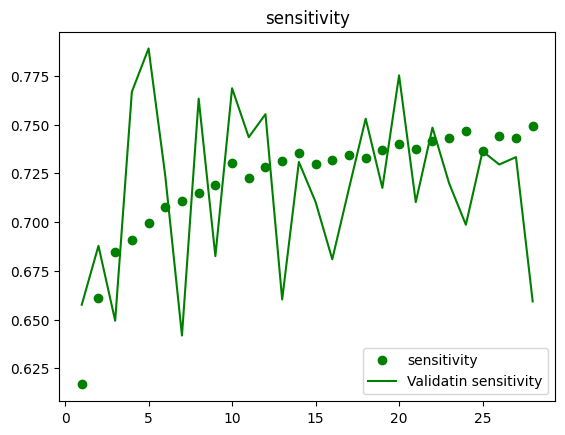

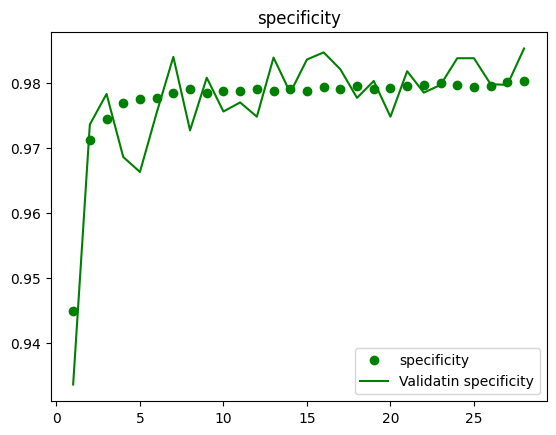

<Figure size 640x480 with 0 Axes>

In [7]:
# Load the model with custom_objects parameter
model = tf.keras.models.load_model(MODEL_PATH, custom_objects=custom_objects)

# Plot history and pring evaluation of test dataset
metrics.print_evaluation(model, test_generator)
check_result.plot_history(HISTORY_PATH)

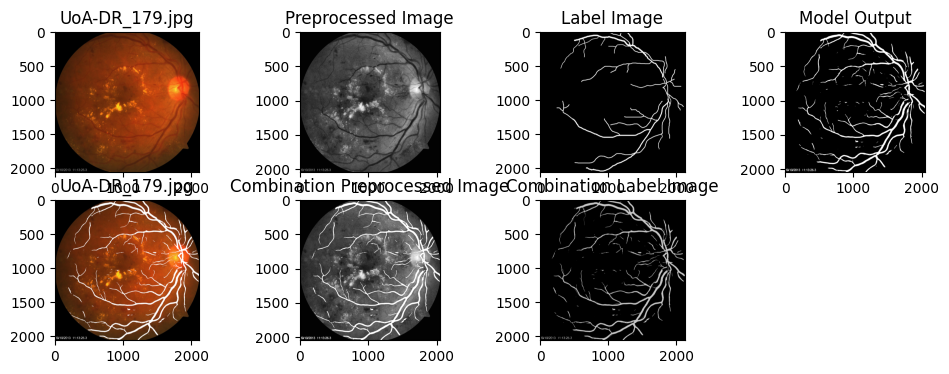

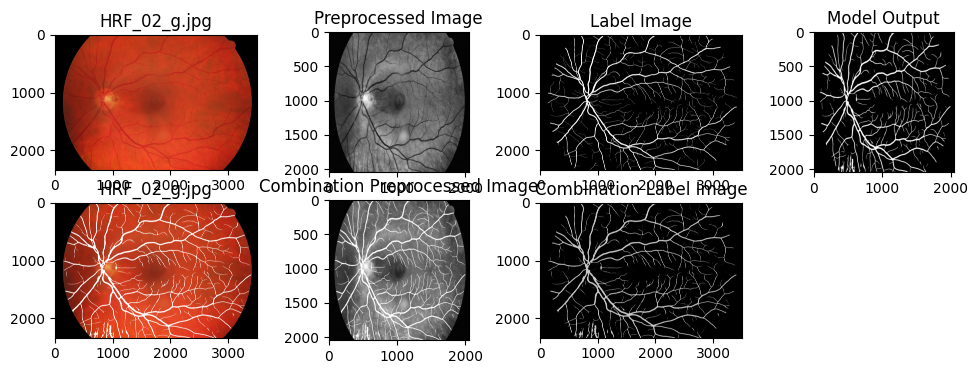

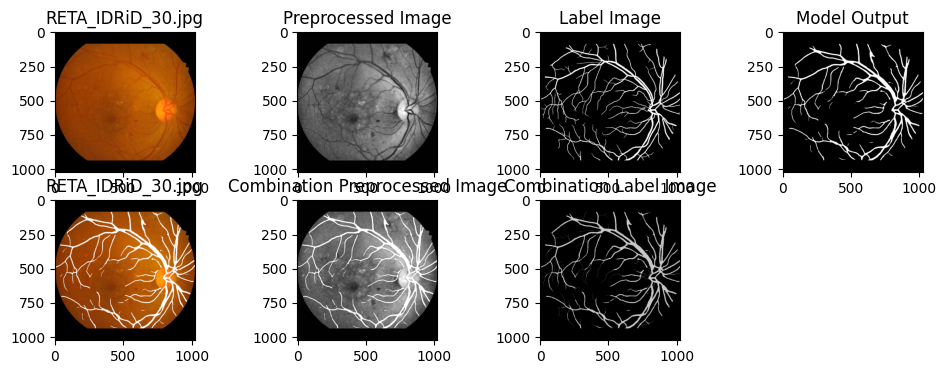

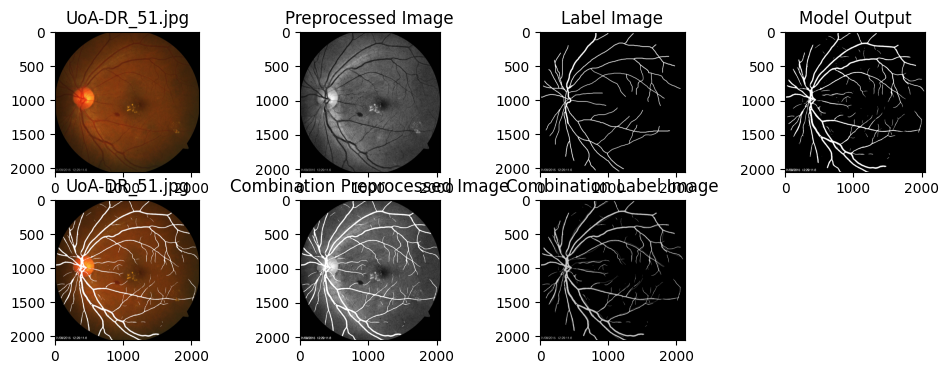

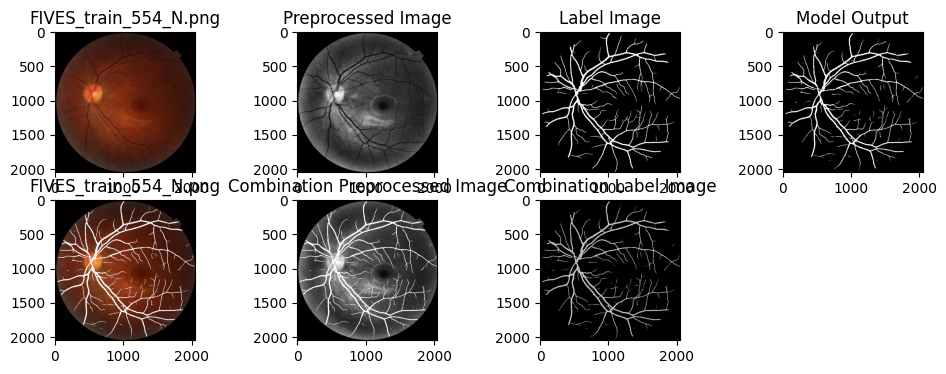

...

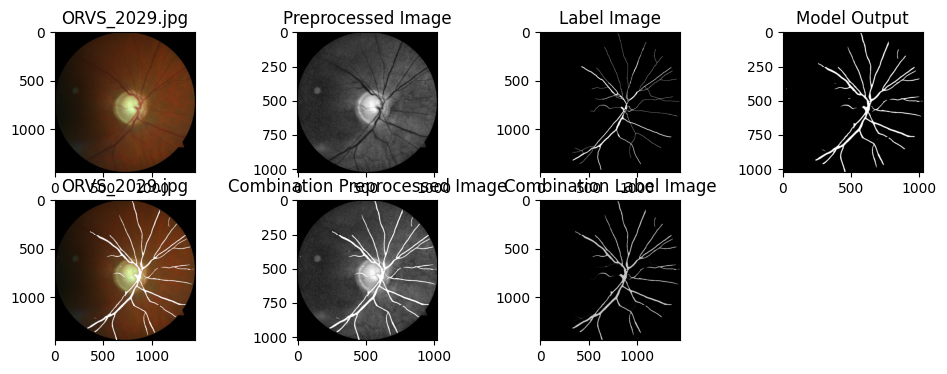

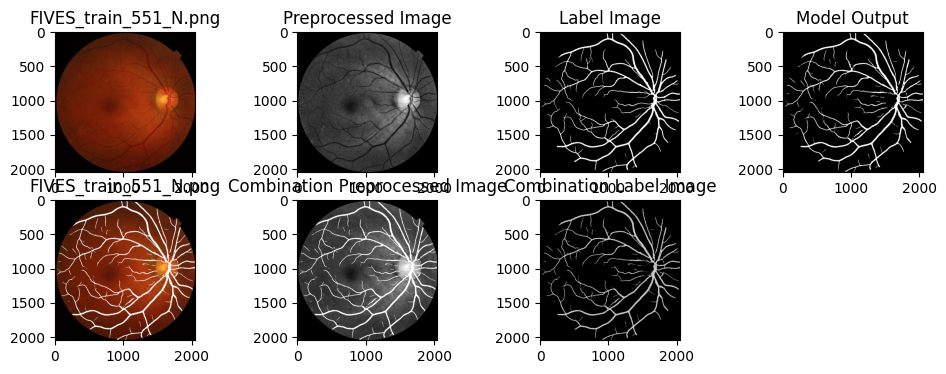

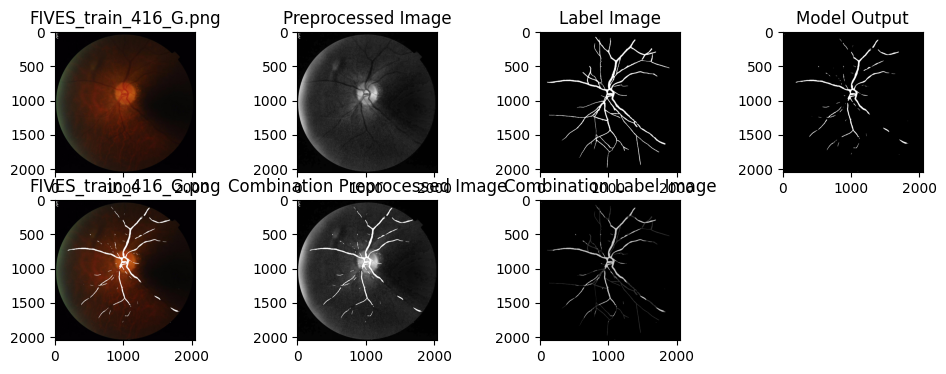

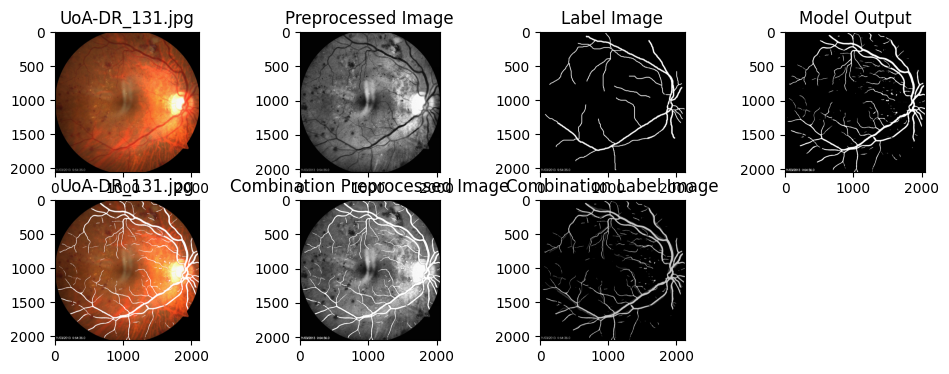

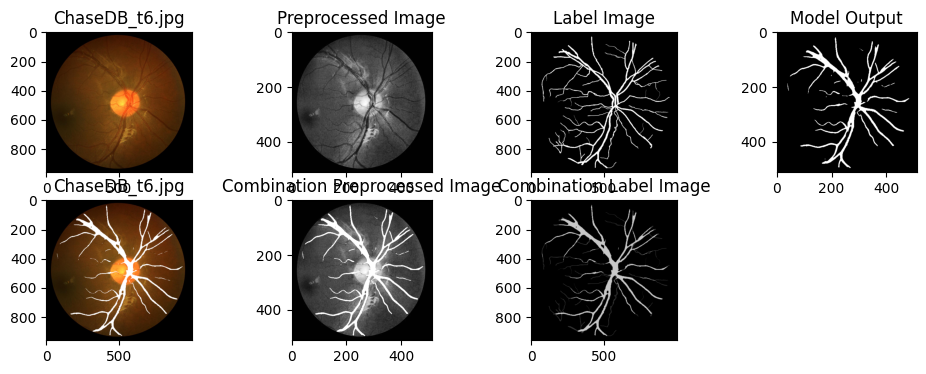

In [8]:
# Plot model result
num_images_to_select = 50
check_result.visualize_AG_result(model, num_images_to_select, SOURCE, INPUT_SHAPE)